### Logistic Regression

In [68]:
import os
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from sklearn.metrics import confusion_matrix

# Set the path to the dataset folder containing subfolders for each class
data_dir = 'Data/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone'

# Define image size
image_size = (200, 200)

# Load dataset
def load_images_and_labels(data_dir, image_size):
    images, labels = [], []
    for class_label, class_name in enumerate(os.listdir(data_dir)):
        class_dir = os.path.join(data_dir, class_name)
        if os.path.isdir(class_dir):  # Check if the file is a directory
            for image_name in os.listdir(class_dir):
                image_path = os.path.join(class_dir, image_name)
                if os.path.isfile(image_path):  # Check if the file is an image file
                    image = load_img(image_path, target_size=image_size)
                    image_array = img_to_array(image) / 255.0
                    images.append(image_array)
                    labels.append(class_label)
    return np.array(images), np.array(labels)

images, labels = load_images_and_labels(data_dir, image_size)

# Prepare the data for logistic regression
X = images.reshape(len(images), -1)
y = labels

# Split the data into training and validation sets
X_val, X_test, y_val, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_val, y_val, test_size=0.1, random_state=42)

# Train the logistic regression model
lr = LogisticRegression(multi_class='ovr', max_iter=500, solver='lbfgs')
lr.fit(X_train, y_train)

# Evaluate the model on the validation set
y_val_pred = lr.predict(X_val)
y_test_pred = lr.predict(X_test)
val_accuracy = accuracy_score(y_val, y_val_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

val_cm = confusion_matrix(y_val, y_val_pred)
test_cm = confusion_matrix(y_test, y_test_pred)
print("Confusion matrix for validation dataset:")
print(val_cm)
print()
print("Confusion matrix for test dataset:")
print(test_cm)
print()
print(f"Validation accuracy: {val_accuracy:.4f}")
print(f"Test accuracy: {test_accuracy:.4f}")

Confusion matrix for validation dataset:
[[218   0   0   0]
 [  0 335   0   0]
 [  0   0 110   1]
 [  0   0   0 457]]

Confusion matrix for test dataset:
[[232   0   0   0]
 [  0 385   0   0]
 [  0   0 138   1]
 [  0   0   0 489]]

Validation accuracy: 0.9991
Test accuracy: 0.9992


In [69]:
print(f"Total images: {len(images)}")
print(f"Train images: {len(X_train)}")
print(f"Validation images: {len(X_val)}")

Total images: 12446
Train images: 10080
Validation images: 1121


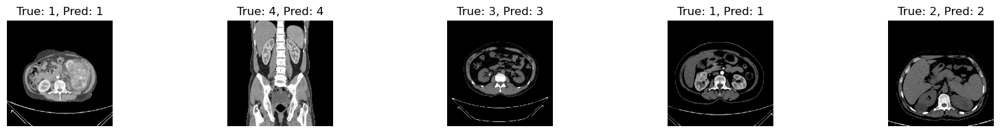

In [70]:
import matplotlib.pyplot as plt

num_samples = 5
fig, axes = plt.subplots(1, num_samples, figsize=(20, 2))
for i, idx in enumerate(np.random.choice(len(X_val), num_samples)):
    img = X_val[idx].reshape(image_size + (3,))
    true_label = y_val[idx]
    pred_label = y_val_pred[idx]
    axes[i].imshow(img)
    axes[i].set_title(f"True: {true_label}, Pred: {pred_label}")
    axes[i].axis("off")
plt.show()

In [71]:
import random

def add_noise(image, noise_factor=0.1):
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    return np.clip(noisy_image, 0., 1.)

# Add noise to the test dataset
noisy_X_test = np.array([add_noise(img.reshape(200, 200, 3)) for img in X_test])

# Reshape the noisy images back to the flattened shape
noisy_X_test = noisy_X_test.reshape(-1, 200 * 200 * 3)

# Make predictions on the noisy test dataset
noisy_y_pred = lr.predict(noisy_X_test)

# Calculate accuracy and confusion matrix on the noisy test dataset
noisy_test_accuracy = accuracy_score(y_test, noisy_y_pred)
noisy_test_cm = confusion_matrix(y_test, noisy_y_pred)

print(f"Noisy test accuracy: {noisy_test_accuracy:.4f}")
print("Confusion matrix for the noisy test dataset:")
print(noisy_test_cm)

Noisy test accuracy: 0.9992
Confusion matrix for the noisy test dataset:
[[232   0   0   0]
 [  0 385   0   0]
 [  0   0 138   1]
 [  0   0   0 489]]


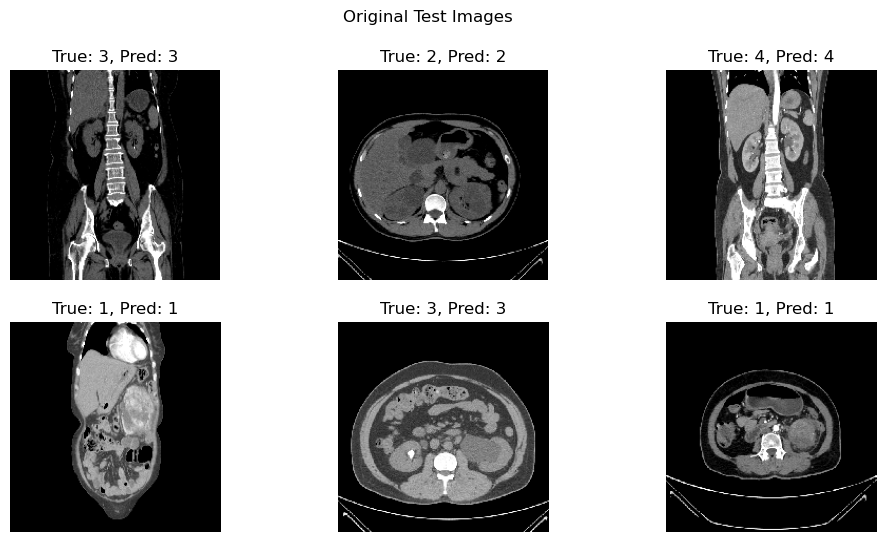

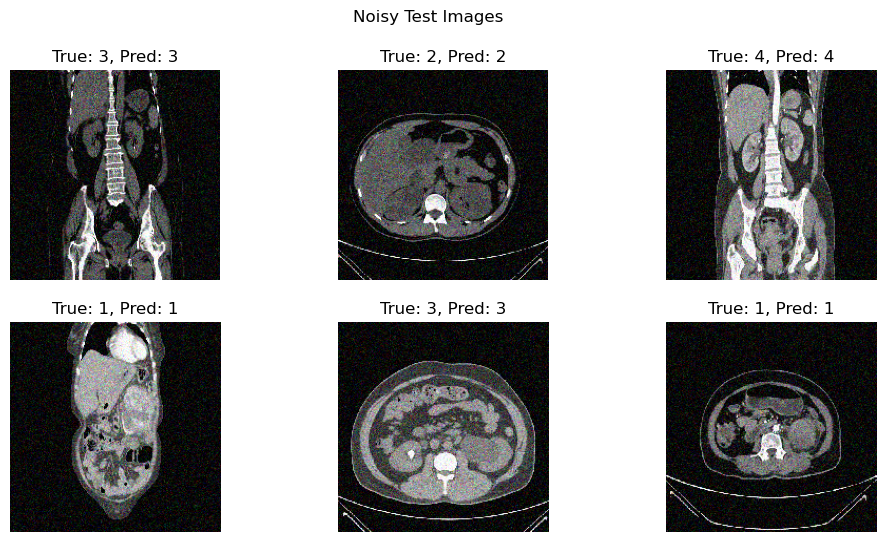

In [72]:
import matplotlib.pyplot as plt

def plot_images(images, labels, predictions=None, title="Images"):
    plt.figure(figsize=(12, 6))
    plt.suptitle(title)
    for i in range(len(images)):
        plt.subplot(2, len(images) // 2, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
        if predictions is None:
            plt.title(f"True label: {labels[i]}")
        else:
            plt.title(f"True: {labels[i]}, Pred: {predictions[i]}")
    plt.show()

# Select some random images from the test dataset
num_samples = 6
indices = random.sample(range(len(X_test)), num_samples)

sample_images = X_test[indices].reshape(-1, 200, 200, 3)
sample_labels = y_test[indices]
sample_preds = y_test_pred[indices]

# Display the original test images with their true and predicted labels
plot_images(sample_images, sample_labels, sample_preds, title="Original Test Images")

# Display the noisy test images with their true and predicted labels
noisy_sample_images = noisy_X_test[indices].reshape(-1, 200, 200, 3)
noisy_sample_preds = noisy_y_pred[indices]

plot_images(noisy_sample_images, sample_labels, noisy_sample_preds, title="Noisy Test Images")

In [73]:
def add_extreme_noise(image, noise_factor=0.5):
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    return np.clip(noisy_image, 0., 1.)

# Add extreme noise to the test dataset
extremely_noisy_X_test = np.array([add_extreme_noise(img) for img in X_test])

# Reshape the noisy images back to the flattened shape
extremely_noisy_X_test_flat = extremely_noisy_X_test.reshape(-1, 200 * 200 * 3)

# Make predictions on the extremely noisy test dataset
extremely_noisy_y_pred = lr.predict(extremely_noisy_X_test_flat)

# Calculate accuracy and confusion matrix on the extremely noisy test dataset
extremely_noisy_test_accuracy = accuracy_score(y_test, extremely_noisy_y_pred)
extremely_noisy_test_cm = confusion_matrix(y_test, extremely_noisy_y_pred)

print(f"Extremely noisy test accuracy: {extremely_noisy_test_accuracy:.4f}")
print("Confusion matrix for the extremely noisy test dataset:")
print(extremely_noisy_test_cm)

Extremely noisy test accuracy: 0.9992
Confusion matrix for the extremely noisy test dataset:
[[232   0   0   0]
 [  0 385   0   0]
 [  0   0 138   1]
 [  0   0   0 489]]


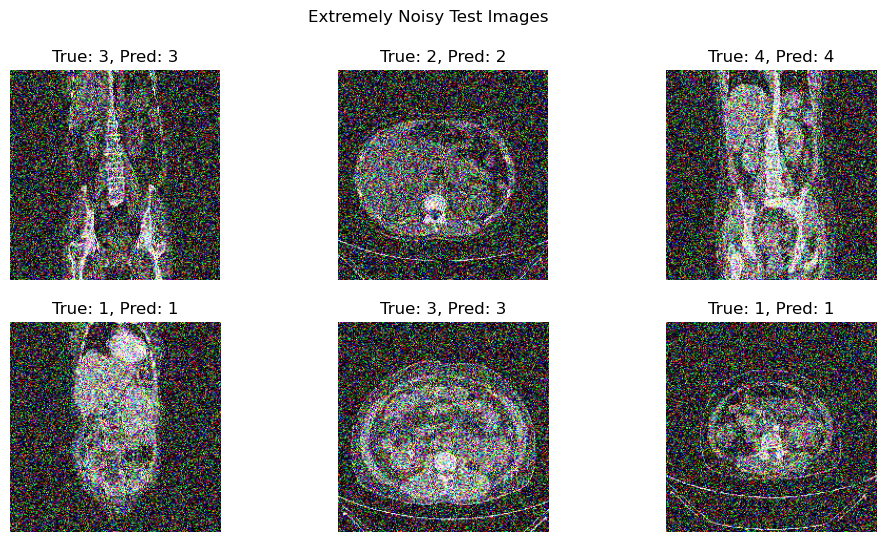

In [74]:
# Display some sample extremely noisy test images with their true and predicted labels
extremely_noisy_sample_images = extremely_noisy_X_test[indices].reshape(-1, 200, 200, 3)
extremely_noisy_sample_preds = extremely_noisy_y_pred[indices]

plot_images(extremely_noisy_sample_images, sample_labels, extremely_noisy_sample_preds, title="Extremely Noisy Test Images")

In [75]:
import skimage
from skimage import transform

# Define the rotation function
def rotate(image, angle):
    rotated_image = transform.rotate(image, angle)
    return rotated_image

# Reshape the images
X_test = X_test.reshape(-1, 200, 200, 3)

# Define the rotation angle (degrees)
angle = 5

# Rotate the test images
rotate_X_test = np.array([rotate(img, angle=angle) for img in X_test])

# Reshape the rotated images back to the flattened shape
rotate_X_test = rotate_X_test.reshape(-1, 200 * 200 * 3)

# Make predictions on the rotated test dataset
rotate_y_pred = lr.predict(rotate_X_test)

# Calculate accuracy on the rotated test dataset
rotate_test_accuracy = accuracy_score(y_test, rotate_y_pred)
print(f"rotated test accuracy: {rotate_test_accuracy:.4f}")

# Print the confusion matrix for the rotated test set
rotate_test_cm = confusion_matrix(y_test, rotate_y_pred)
print("confusion matrix for rotated test dataset:")
print(rotate_test_cm)

rotated test accuracy: 0.8418
confusion matrix for rotated test dataset:
[[120  32   2  78]
 [  0 371   7   7]
 [  0  23  90  26]
 [  0   8  14 467]]


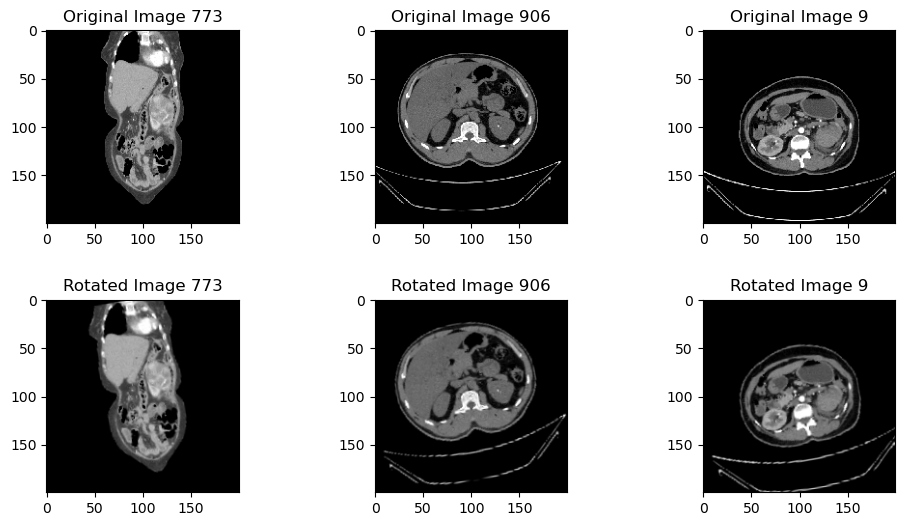

In [76]:
import matplotlib.pyplot as plt

# Define the rotation function
def rotate(image, angle):
    rotated_image = transform.rotate(image, angle)
    rotation_matrix = transform.AffineTransform(rotation=np.deg2rad(angle))
    return rotated_image, rotation_matrix

import random

# Select 3 random images from the rotated test dataset
num_images = 3
image_indices = random.sample(range(len(rotate_X_test)), num_images)
images = rotate_X_test[image_indices]
original_images = X_test[image_indices]

# Define the rotation angle (degrees)
angle = 5

# Create a figure with subplots for each image
fig, ax = plt.subplots(2, num_images, figsize=(12, 6))

# Loop through the selected images and plot them
for i, image in enumerate(images):
    # Rotate the image and get the rotation matrix
    rotated_image, rotation_matrix = rotate(image.reshape(200, 200, 3), angle=angle)
    
    # Plot the original and rotated images side by side
    ax[0, i].imshow(original_images[i])
    ax[0, i].set_title(f"Original Image {image_indices[i]}")
    ax[1, i].imshow(rotated_image)
    ax[1, i].set_title(f"Rotated Image {image_indices[i]}")

# Add more spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.4)

plt.show()

In [77]:
import random
from sklearn.metrics import accuracy_score
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.1, angle=5):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Add noise and rotation to the test dataset
noisy_rotated_X_test = np.array([add_noise_and_rotate(img) for img in X_test])
noisy_rotated_X_test_flat = noisy_rotated_X_test.reshape(-1, 200 * 200 * 3)

# Make predictions on the noisy and rotated test dataset
noisy_rotated_y_pred = lr.predict(noisy_rotated_X_test_flat)
noisy_rotated_y_pred_labels = noisy_rotated_y_pred

# Calculate accuracy on the noisy and rotated test dataset
noisy_rotated_test_accuracy = accuracy_score(y_test, noisy_rotated_y_pred_labels)
print(f"Noisy and rotated test accuracy: {noisy_rotated_test_accuracy:.4f}")

# Print the confusion matrix for the noisy and rotated test dataset
noisy_rotated_test_cm = confusion_matrix(y_test, noisy_rotated_y_pred_labels)
print("Confusion matrix for noisy and rotated test dataset:")
print(noisy_rotated_test_cm)

Noisy and rotated test accuracy: 0.8369
Confusion matrix for noisy and rotated test dataset:
[[114  34   3  81]
 [  0 371   8   6]
 [  0  22  89  28]
 [  0   7  14 468]]


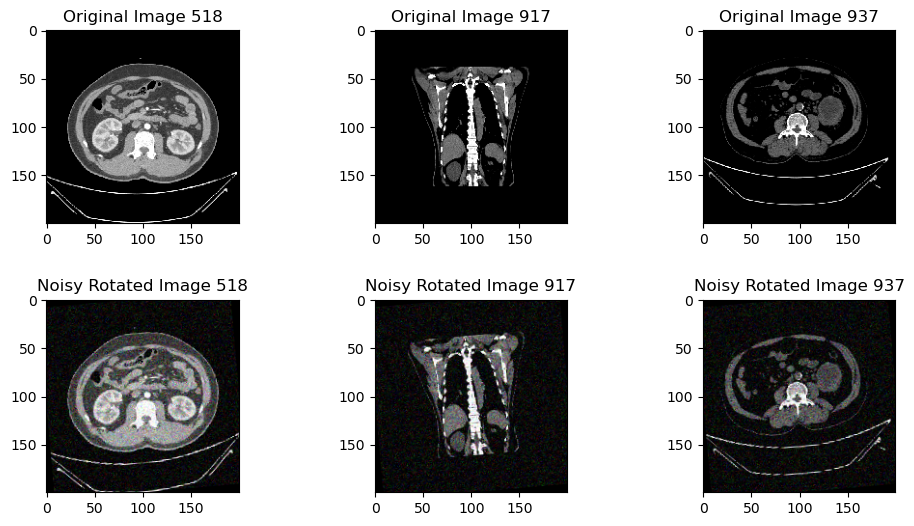

In [78]:
import random
import matplotlib.pyplot as plt
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.1, angle=5):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Select 3 random images from the test dataset
num_images = 3
image_indices = random.sample(range(len(X_test)), num_images)
images = X_test[image_indices]

# Define the rotation angle (degrees) and noise factor
angle = 5
noise_factor = 0.1

# Rotate and add noise to the images
rotated_noisy_images = np.array([add_noise_and_rotate(img, noise_factor=noise_factor, angle=angle) for img in images])

# Create a figure with subplots for each image
fig, ax = plt.subplots(2, num_images, figsize=(12, 6))

# Loop through the selected images and plot them
for i, image in enumerate(images):
    # Plot the original image
    ax[0, i].imshow(image)
    ax[0, i].set_title(f"Original Image {image_indices[i]}")
    
    # Plot the rotated-noisy image
    ax[1, i].imshow(rotated_noisy_images[i])
    ax[1, i].set_title(f"Noisy Rotated Image {image_indices[i]}")

# Add more spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.4)

plt.show()

In [79]:
import random
from sklearn.metrics import accuracy_score
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.5, angle=15):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Add noise and rotation to the test dataset
noisy_rotated_X_test = np.array([add_noise_and_rotate(img) for img in X_test])
noisy_rotated_X_test_flat = noisy_rotated_X_test.reshape(-1, 200 * 200 * 3)

# Make predictions on the noisy and rotated test dataset
noisy_rotated_y_pred = lr.predict(noisy_rotated_X_test_flat)
noisy_rotated_y_pred_labels = noisy_rotated_y_pred

# Calculate accuracy on the noisy and rotated test dataset
noisy_rotated_test_accuracy = accuracy_score(y_test, noisy_rotated_y_pred_labels)
print(f"Noisy and rotated test accuracy: {noisy_rotated_test_accuracy:.4f}")

# Print the confusion matrix for the noisy and rotated test dataset
noisy_rotated_test_cm = confusion_matrix(y_test, noisy_rotated_y_pred_labels)
print("Confusion matrix for noisy and rotated test dataset:")
print(noisy_rotated_test_cm)

Noisy and rotated test accuracy: 0.5920
Confusion matrix for noisy and rotated test dataset:
[[  9  26  17 180]
 [  0 236  50  99]
 [  0  23  28  88]
 [  1   6  18 464]]


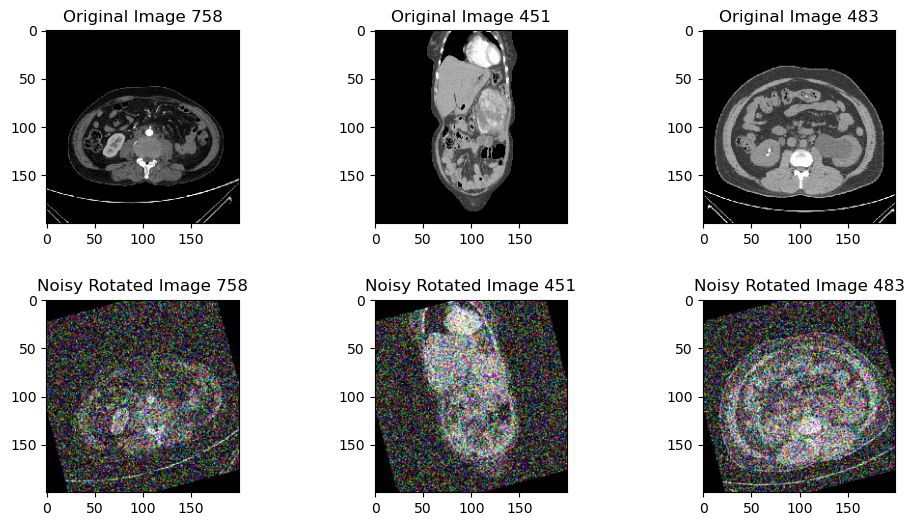

In [80]:
import random
import matplotlib.pyplot as plt
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.5, angle=15):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Select 3 random images from the test dataset
num_images = 3
image_indices = random.sample(range(len(X_test)), num_images)
images = X_test[image_indices]

# Define the rotation angle (degrees) and noise factor
angle = 15
noise_factor = 0.5

# Rotate and add noise to the images
rotated_noisy_images = np.array([add_noise_and_rotate(img, noise_factor=noise_factor, angle=angle) for img in images])

# Create a figure with subplots for each image
fig, ax = plt.subplots(2, num_images, figsize=(12, 6))

# Loop through the selected images and plot them
for i, image in enumerate(images):
    # Plot the original image
    ax[0, i].imshow(image)
    ax[0, i].set_title(f"Original Image {image_indices[i]}")
    
    # Plot the rotated-noisy image
    ax[1, i].imshow(rotated_noisy_images[i])
    ax[1, i].set_title(f"Noisy Rotated Image {image_indices[i]}")

# Add more spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.4)

plt.show()

### Random Forest

In [81]:
import os
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from sklearn.metrics import confusion_matrix

# Set the path to the dataset folder containing subfolders for each class
data_dir = 'Data/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone'

# Define image size
image_size = (200, 200)

# Load dataset
def load_images_and_labels(data_dir, image_size):
    images, labels = [], []
    for class_label, class_name in enumerate(os.listdir(data_dir)):
        class_dir = os.path.join(data_dir, class_name)
        if os.path.isdir(class_dir):  # Check if the file is a directory
            for image_name in os.listdir(class_dir):
                image_path = os.path.join(class_dir, image_name)
                if os.path.isfile(image_path):  # Check if the file is an image file
                    image = load_img(image_path, target_size=image_size)
                    image_array = img_to_array(image) / 255.0
                    images.append(image_array)
                    labels.append(class_label)
    return np.array(images), np.array(labels)

images, labels = load_images_and_labels(data_dir, image_size)

# Prepare the data for logistic regression
X = images.reshape(len(images), -1)
y = labels

X_val, X_test, y_val, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_val, y_val, test_size=0.1, random_state=42)

from sklearn.ensemble import RandomForestClassifier 

# Train the Random Forest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)  # Create a Random Forest classifier
rf.fit(X_train, y_train)

# Evaluate the model on the validation set
y_val_pred = rf.predict(X_val)
y_test_pred = rf.predict(X_test)
val_accuracy = accuracy_score(y_val, y_val_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

val_cm = confusion_matrix(y_val, y_val_pred)
test_cm = confusion_matrix(y_test, y_test_pred)
print("Confusion matrix for validation dataset:")
print(val_cm)
print()
print("Confusion matrix for test dataset:")
print(test_cm)
print()
print(f"Validation accuracy: {val_accuracy:.4f}")
print(f"Test accuracy: {test_accuracy:.4f}")

Confusion matrix for validation dataset:
[[218   0   0   0]
 [  0 335   0   0]
 [  0   0 109   2]
 [  0   0   0 457]]

Confusion matrix for test dataset:
[[232   0   0   0]
 [  0 385   0   0]
 [  0   0 138   1]
 [  0   0   0 489]]

Validation accuracy: 0.9982
Test accuracy: 0.9992


In [82]:
import random

def add_noise(image, noise_factor=0.1):
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    return np.clip(noisy_image, 0., 1.)

# Add noise to the test dataset
noisy_X_test = np.array([add_noise(img.reshape(200, 200, 3)) for img in X_test])

# Reshape the noisy images back to the flattened shape
noisy_X_test = noisy_X_test.reshape(-1, 200 * 200 * 3)

# Make predictions on the noisy test dataset
noisy_y_pred = rf.predict(noisy_X_test)

# Calculate accuracy on the noisy test dataset
noisy_test_accuracy = accuracy_score(y_test, noisy_y_pred)
noisy_test_cm = confusion_matrix(y_test, noisy_y_pred)

print(f"Noisy test accuracy: {noisy_test_accuracy:.4f}")
print("Confusion matrix for the noisy test dataset:")
print(noisy_test_cm)

Noisy test accuracy: 0.9711
Confusion matrix for the noisy test dataset:
[[222   1   2   7]
 [  0 367  15   3]
 [  0   0 133   6]
 [  0   1   1 487]]


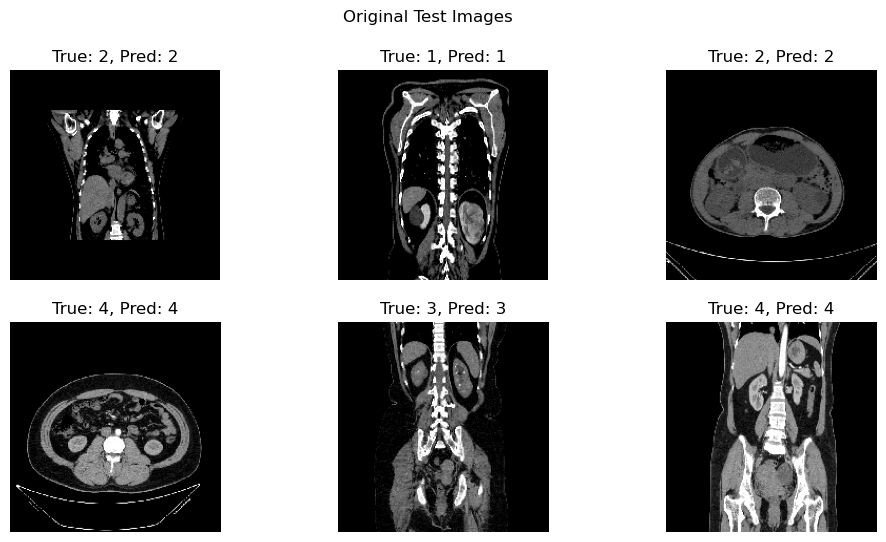

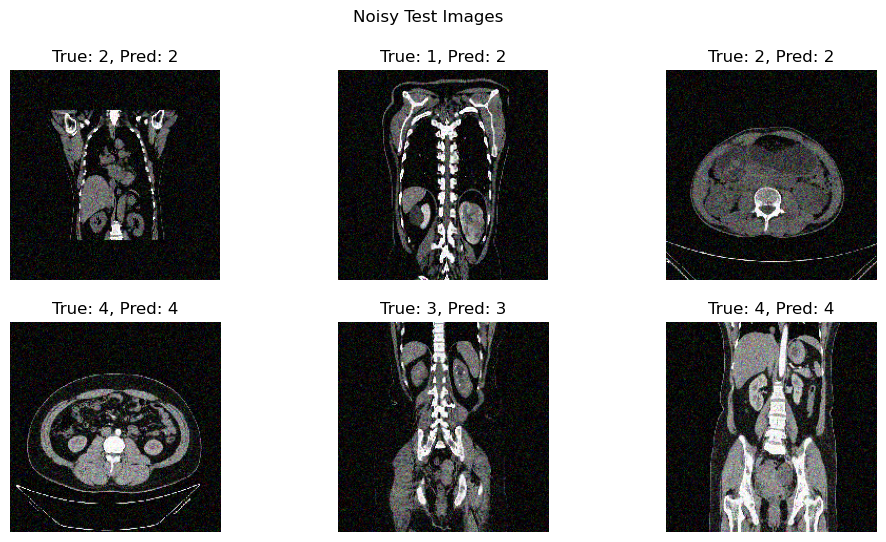

In [83]:
import matplotlib.pyplot as plt

def plot_images(images, labels, predictions=None, title="Images"):
    plt.figure(figsize=(12, 6))
    plt.suptitle(title)
    for i in range(len(images)):
        plt.subplot(2, len(images) // 2, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
        if predictions is None:
            plt.title(f"True label: {labels[i]}")
        else:
            plt.title(f"True: {labels[i]}, Pred: {predictions[i]}")
    plt.show()

# Select some random images from the test dataset
num_samples = 6
indices = random.sample(range(len(X_test)), num_samples)

sample_images = X_test[indices].reshape(-1, 200, 200, 3)
sample_labels = y_test[indices]
sample_preds = y_test_pred[indices]

# Display the original test images with their true and predicted labels
plot_images(sample_images, sample_labels, sample_preds, title="Original Test Images")

# Display the noisy test images with their true and predicted labels
noisy_sample_images = noisy_X_test[indices].reshape(-1, 200, 200, 3)
noisy_sample_preds = noisy_y_pred[indices]

plot_images(noisy_sample_images, sample_labels, noisy_sample_preds, title="Noisy Test Images")

In [84]:
def add_extreme_noise(image, noise_factor=0.5):
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    return np.clip(noisy_image, 0., 1.)

# Add extreme noise to the test dataset
extremely_noisy_X_test = np.array([add_extreme_noise(img) for img in X_test])

# Reshape the noisy images back to the flattened shape
extremely_noisy_X_test_flat = extremely_noisy_X_test.reshape(-1, 200 * 200 * 3)

# Make predictions on the extremely noisy test dataset
extremely_noisy_y_pred = rf.predict(extremely_noisy_X_test_flat)

# Calculate accuracy on the extremely noisy test dataset
extremely_noisy_test_accuracy = accuracy_score(y_test, extremely_noisy_y_pred)
extremely_noisy_test_cm = confusion_matrix(y_test, extremely_noisy_y_pred)

print(f"Extremely noisy test accuracy: {extremely_noisy_test_accuracy:.4f}")
print("Confusion matrix for the extremely noisy test dataset:")
print(extremely_noisy_test_cm)

Extremely noisy test accuracy: 0.3044
Confusion matrix for the extremely noisy test dataset:
[[192   3  18  19]
 [215  40  95  35]
 [ 59   5  58  17]
 [278   4 118  89]]


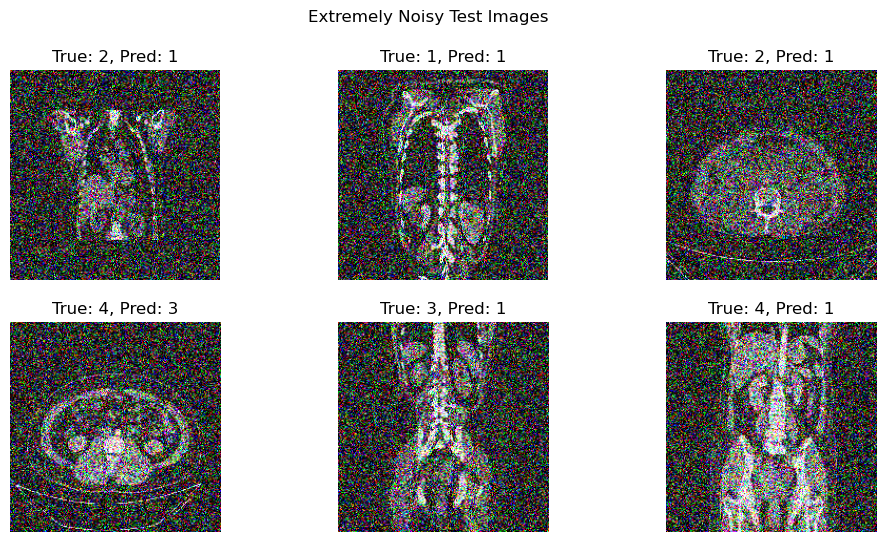

In [85]:
# Display some sample extremely noisy test images with their true and predicted labels
extremely_noisy_sample_images = extremely_noisy_X_test[indices].reshape(-1, 200, 200, 3)
extremely_noisy_sample_preds = extremely_noisy_y_pred[indices]

plot_images(extremely_noisy_sample_images, sample_labels, extremely_noisy_sample_preds, title="Extremely Noisy Test Images")

In [86]:
import skimage
from skimage import transform

# Define the rotation function
def rotate(image, angle):
    rotated_image = transform.rotate(image, angle)
    return rotated_image

# Reshape the images
X_test = X_test.reshape(-1, 200, 200, 3)

# Define the rotation angle (degrees)
angle = 5

# Rotate the test images
rotate_X_test = np.array([rotate(img, angle=angle) for img in X_test])

# Reshape the rotated images back to the flattened shape
rotate_X_test = rotate_X_test.reshape(-1, 200 * 200 * 3)

# Make predictions on the rotated test dataset
rotate_y_pred = rf.predict(rotate_X_test)

# Calculate accuracy on the rotated test dataset
rotate_test_accuracy = accuracy_score(y_test, rotate_y_pred)
print(f"rotated test accuracy: {rotate_test_accuracy:.4f}")

# Print the confusion matrix for the rotated test set
rotate_test_cm = confusion_matrix(y_test, rotate_y_pred)
print("confusion matrix for rotated test dataset:")
print(rotate_test_cm)

rotated test accuracy: 0.8618
confusion matrix for rotated test dataset:
[[131  32   0  69]
 [  0 385   0   0]
 [  0  42  71  26]
 [  1   2   0 486]]


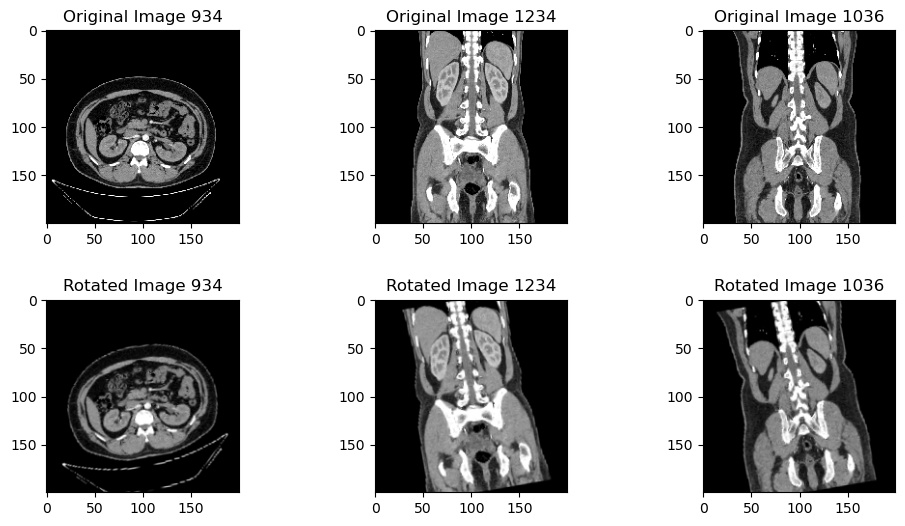

In [87]:
import matplotlib.pyplot as plt

# Define the rotation function
def rotate(image, angle):
    rotated_image = transform.rotate(image, angle)
    rotation_matrix = transform.AffineTransform(rotation=np.deg2rad(angle))
    return rotated_image, rotation_matrix

import random

# Select 3 random images from the rotated test dataset
num_images = 3
image_indices = random.sample(range(len(rotate_X_test)), num_images)
images = rotate_X_test[image_indices]
original_images = X_test[image_indices]

# Define the rotation angle (degrees)
angle = 5

# Create a figure with subplots for each image
fig, ax = plt.subplots(2, num_images, figsize=(12, 6))

# Loop through the selected images and plot them
for i, image in enumerate(images):
    # Rotate the image and get the rotation matrix
    rotated_image, rotation_matrix = rotate(image.reshape(200, 200, 3), angle=angle)
    
    # Plot the original and rotated images side by side
    ax[0, i].imshow(original_images[i])
    ax[0, i].set_title(f"Original Image {image_indices[i]}")
    ax[1, i].imshow(rotated_image)
    ax[1, i].set_title(f"Rotated Image {image_indices[i]}")

# Add more spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.4)

plt.show()

In [88]:
import random
from sklearn.metrics import accuracy_score
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.1, angle=5):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Add noise and rotation to the test dataset
noisy_rotated_X_test = np.array([add_noise_and_rotate(img) for img in X_test])
noisy_rotated_X_test_flat = noisy_rotated_X_test.reshape(-1, 200 * 200 * 3)

# Make predictions on the noisy and rotated test dataset
noisy_rotated_y_pred = rf.predict(noisy_rotated_X_test_flat)
noisy_rotated_y_pred_labels = noisy_rotated_y_pred

# Calculate accuracy on the noisy and rotated test dataset
noisy_rotated_test_accuracy = accuracy_score(y_test, noisy_rotated_y_pred_labels)
print(f"Noisy and rotated test accuracy: {noisy_rotated_test_accuracy:.4f}")

# Print the confusion matrix for the noisy and rotated test dataset
noisy_rotated_test_cm = confusion_matrix(y_test, noisy_rotated_y_pred_labels)
print("Confusion matrix for noisy and rotated test dataset:")
print(noisy_rotated_test_cm)

Noisy and rotated test accuracy: 0.6112
Confusion matrix for noisy and rotated test dataset:
[[ 69  23  49  91]
 [  0 185 185  15]
 [  0   6 117  16]
 [  1   1  97 390]]


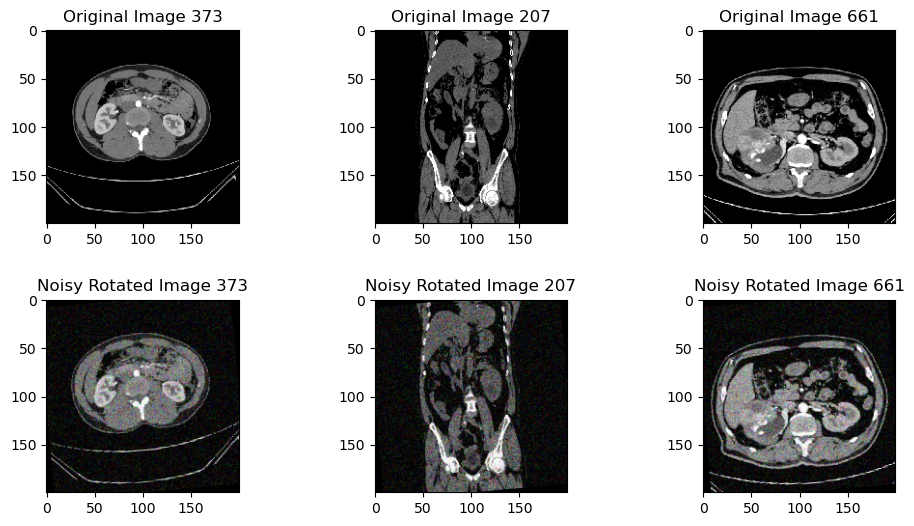

In [89]:
import random
import matplotlib.pyplot as plt
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.1, angle=5):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Select 3 random images from the test dataset
num_images = 3
image_indices = random.sample(range(len(X_test)), num_images)
images = X_test[image_indices]

# Define the rotation angle (degrees) and noise factor
angle = 5
noise_factor = 0.1

# Rotate and add noise to the images
rotated_noisy_images = np.array([add_noise_and_rotate(img, noise_factor=noise_factor, angle=angle) for img in images])

# Create a figure with subplots for each image
fig, ax = plt.subplots(2, num_images, figsize=(12, 6))

# Loop through the selected images and plot them
for i, image in enumerate(images):
    # Plot the original image
    ax[0, i].imshow(image)
    ax[0, i].set_title(f"Original Image {image_indices[i]}")
    
    # Plot the rotated-noisy image
    ax[1, i].imshow(rotated_noisy_images[i])
    ax[1, i].set_title(f"Noisy Rotated Image {image_indices[i]}")

# Add more spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.4)

plt.show()

In [90]:
import random
from sklearn.metrics import accuracy_score
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.5, angle=15):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Add noise and rotation to the test dataset
noisy_rotated_X_test = np.array([add_noise_and_rotate(img) for img in X_test])
noisy_rotated_X_test_flat = noisy_rotated_X_test.reshape(-1, 200 * 200 * 3)

# Make predictions on the noisy and rotated test dataset
noisy_rotated_y_pred = rf.predict(noisy_rotated_X_test_flat)
noisy_rotated_y_pred_labels = noisy_rotated_y_pred

# Calculate accuracy on the noisy and rotated test dataset
noisy_rotated_test_accuracy = accuracy_score(y_test, noisy_rotated_y_pred_labels)
print(f"Noisy and rotated test accuracy: {noisy_rotated_test_accuracy:.4f}")

# Print the confusion matrix for the noisy and rotated test dataset
noisy_rotated_test_cm = confusion_matrix(y_test, noisy_rotated_y_pred_labels)
print("Confusion matrix for noisy and rotated test dataset:")
print(noisy_rotated_test_cm)

Noisy and rotated test accuracy: 0.1454
Confusion matrix for noisy and rotated test dataset:
[[ 19   0 188  25]
 [ 11   1 348  25]
 [  5   0 118  16]
 [ 25   0 421  43]]


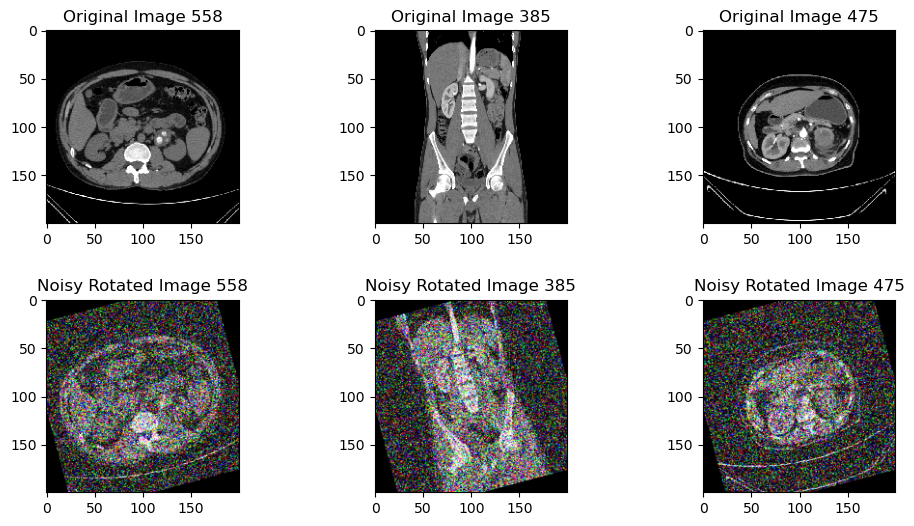

In [91]:
import random
import matplotlib.pyplot as plt
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.3, angle=10):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Select 3 random images from the test dataset
num_images = 3
image_indices = random.sample(range(len(X_test)), num_images)
images = X_test[image_indices]

# Define the rotation angle (degrees) and noise factor
angle = 15
noise_factor = 0.5

# Rotate and add noise to the images
rotated_noisy_images = np.array([add_noise_and_rotate(img, noise_factor=noise_factor, angle=angle) for img in images])

# Create a figure with subplots for each image
fig, ax = plt.subplots(2, num_images, figsize=(12, 6))

# Loop through the selected images and plot them
for i, image in enumerate(images):
    # Plot the original image
    ax[0, i].imshow(image)
    ax[0, i].set_title(f"Original Image {image_indices[i]}")
    
    # Plot the rotated-noisy image
    ax[1, i].imshow(rotated_noisy_images[i])
    ax[1, i].set_title(f"Noisy Rotated Image {image_indices[i]}")

# Add more spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.4)

plt.show()

### CNN with SMOTE

In [56]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.model_selection import train_test_split
import pandas as pd
from imblearn.over_sampling import SMOTE
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix

# Set the path to the dataset folder containing subfolders for each class
data_dir = 'Data/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone'

# Define image size and batch size
image_size = (125, 125)
batch_size = 32

# Load dataset
train_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(data_dir,
                                               target_size=image_size,
                                               batch_size=batch_size,
                                               class_mode='sparse',
                                               shuffle=False)

# Get all the data and labels
train_data1, train_labels1 = [], []
for _ in range(len(train_data)):
    data_batch, labels_batch = train_data.next()
    train_data1.extend(data_batch)
    train_labels1.extend(labels_batch)

train_data1 = np.array(train_data1)
train_labels1 = np.array(train_labels1)

# Split dataset into train+validation and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(train_data1, train_labels1, test_size=0.10, random_state=42)

# Split train+validation set into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.10, random_state=42)

# Apply SMOTE for oversampling on the training data only
smt = SMOTE()
train_rows = len(X_train)
X_train_oversampled, y_train_oversampled = smt.fit_resample(X_train.reshape(train_rows, -1), y_train)
X_train_oversampled = X_train_oversampled.reshape(-1, 125, 125, 3)

# Build the model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(125, 125, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')  # Assuming 4 classes in the dataset
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy',
                               patience=5,
                               restore_best_weights=True)

# Train the model
history = model.fit(X_train_oversampled, y_train_oversampled,
                    epochs=50,
                    validation_data=(X_val, y_val),
                    callbacks=[early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test loss: {test_loss:.4f}")
print(f"Test accuracy: {test_accuracy:.4f}")

#Get predicted labels for the test dataset
y_test_pred = model.predict(X_test)
y_test_pred = np.argmax(y_test_pred, axis=1)

#Calculate the confusion matrix for the test dataset
cm = confusion_matrix(y_test, y_test_pred)
print("Confusion matrix for the test dataset:")
print(cm)

Found 12446 images belonging to 4 classes.
Epoch 1/50


2023-04-19 11:24:53.781650: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


515/515 [==============================] - ETA: 0s - loss: 0.1759 - accuracy: 0.9302

2023-04-19 11:25:05.614251: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


515/515 [==============================] - 13s 24ms/step - loss: 0.1759 - accuracy: 0.9302 - val_loss: 0.0068 - val_accuracy: 0.9982
Epoch 2/50
515/515 [==============================] - 11s 22ms/step - loss: 0.0110 - accuracy: 0.9964 - val_loss: 8.9987e-04 - val_accuracy: 1.0000
Epoch 3/50
515/515 [==============================] - 11s 22ms/step - loss: 0.0042 - accuracy: 0.9986 - val_loss: 1.6601e-05 - val_accuracy: 1.0000
Epoch 4/50
515/515 [==============================] - 12s 23ms/step - loss: 0.0097 - accuracy: 0.9975 - val_loss: 0.0011 - val_accuracy: 0.9991
Epoch 5/50
515/515 [==============================] - 12s 23ms/step - loss: 0.0098 - accuracy: 0.9976 - val_loss: 3.2502e-04 - val_accuracy: 1.0000
Epoch 6/50
515/515 [==============================] - 12s 22ms/step - loss: 0.0029 - accuracy: 0.9992 - val_loss: 4.8976e-04 - val_accuracy: 1.0000
Epoch 7/50
39/39 [==============================] - 1s 13ms/step - loss: 7.4149e-04 - accuracy: 1.0000
Test loss: 0.0007
Test accur

2023-04-19 11:26:16.730304: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


39/39 [==============================] - 0s 9ms/step
Confusion matrix for the test dataset:
[[396   0   0   0]
 [  0 503   0   0]
 [  0   0 137   0]
 [  0   0   0 209]]


In [57]:
import random
from sklearn.metrics import accuracy_score

def add_noise(image, noise_factor=0.1):
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    return np.clip(noisy_image, 0., 1.)

# Add noise to the test dataset
noisy_X_test = np.array([add_noise(img) for img in X_test])

# Make predictions on the noisy test dataset
noisy_y_pred = model.predict(noisy_X_test)
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)

# Calculate accuracy on the noisy test dataset
noisy_test_accuracy = accuracy_score(y_test, noisy_y_pred_labels)
print(f"Noisy test accuracy: {noisy_test_accuracy:.4f}")

# Calculate the confusion matrix for the noisy test dataset
cm = confusion_matrix(y_test, noisy_y_pred_labels)
print("Confusion matrix for the noisy test dataset:")
print(cm)

39/39 [==============================] - 0s 11ms/step
Noisy test accuracy: 1.0000
Confusion matrix for the noisy test dataset:
[[396   0   0   0]
 [  0 503   0   0]
 [  0   0 137   0]
 [  0   0   0 209]]


39/39 [==============================] - 0s 9ms/step


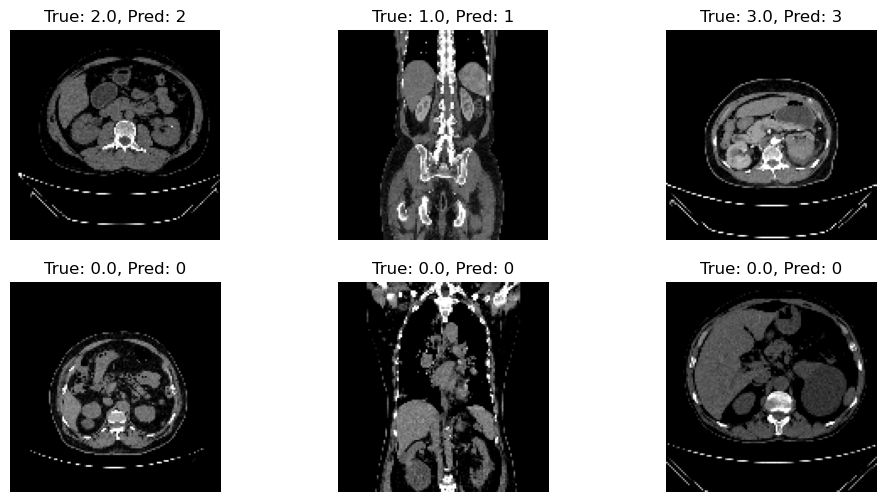

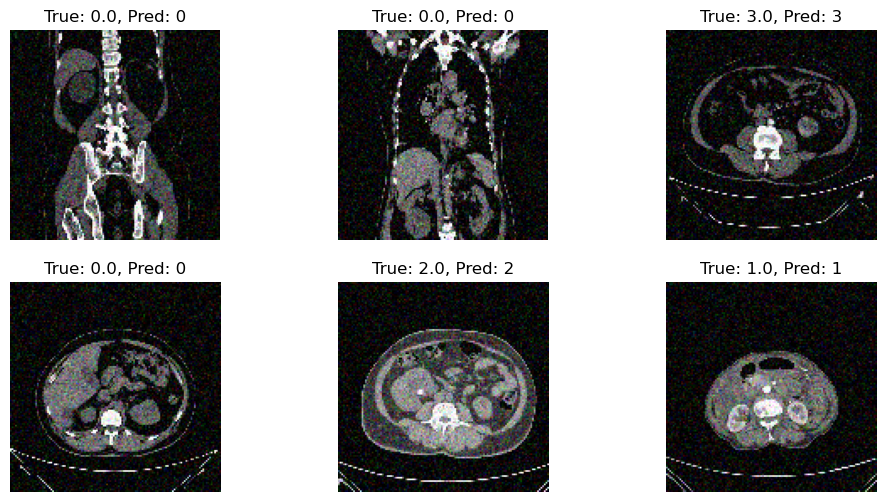

In [58]:
import random
import matplotlib.pyplot as plt

# Define a function to plot sample images and their predictions
def plot_sample_images(images, labels, predictions=None, num_samples=6):
    # Select some random images
    indices = random.sample(range(len(images)), num_samples)
    sample_images = images[indices]
    sample_labels = labels[indices]
    if predictions is not None:
        sample_preds = predictions[indices]
    
    # Plot the sample images
    plt.figure(figsize=(12, 6))
    for i in range(num_samples):
        plt.subplot(2, num_samples // 2, i + 1)
        plt.imshow(sample_images[i])
        plt.axis('off')
        if predictions is None:
            plt.title(f"True label: {sample_labels[i]}")
        else:
            true_label = sample_labels[i]
            pred_label = sample_preds[i]
            plt.title(f"True: {true_label}, Pred: {pred_label}")
    plt.show()

# Plot some sample original test images and their predictions
y_test_pred_labels = np.argmax(model.predict(X_test), axis=1)
plot_sample_images(X_test, y_test, predictions=y_test_pred_labels)

# Plot some sample noisy test images and their predictions
noisy_X_test = np.array([add_noise(img) for img in X_test])
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)
plot_sample_images(noisy_X_test, y_test, predictions=noisy_y_pred_labels)

In [59]:
def add_extreme_noise(image, noise_factor=0.5):
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    return np.clip(noisy_image, 0., 1.)

# Add extreme noise to the test dataset
extremely_noisy_X_test = np.array([add_extreme_noise(img) for img in X_test])

# Make predictions on the extremely noisy test dataset
extremely_noisy_y_pred = model.predict(extremely_noisy_X_test)
extremely_noisy_y_pred_labels = np.argmax(extremely_noisy_y_pred, axis=1)

# Calculate accuracy on the extremely noisy test dataset
extremely_noisy_test_accuracy = accuracy_score(y_test, extremely_noisy_y_pred_labels)
print(f"Extremely noisy test accuracy: {extremely_noisy_test_accuracy:.4f}")

# Calculate the confusion matrix for the extremely noisy test dataset
cm = confusion_matrix(y_test, extremely_noisy_y_pred_labels)
print("Confusion matrix for the extremely noisy test dataset:")
print(cm)

39/39 [==============================] - 0s 8ms/step
Extremely noisy test accuracy: 0.5558
Confusion matrix for the extremely noisy test dataset:
[[389   0   0   7]
 [131  98  19 255]
 [ 97   0  28  12]
 [ 32   0   0 177]]


39/39 [==============================] - 1s 13ms/step


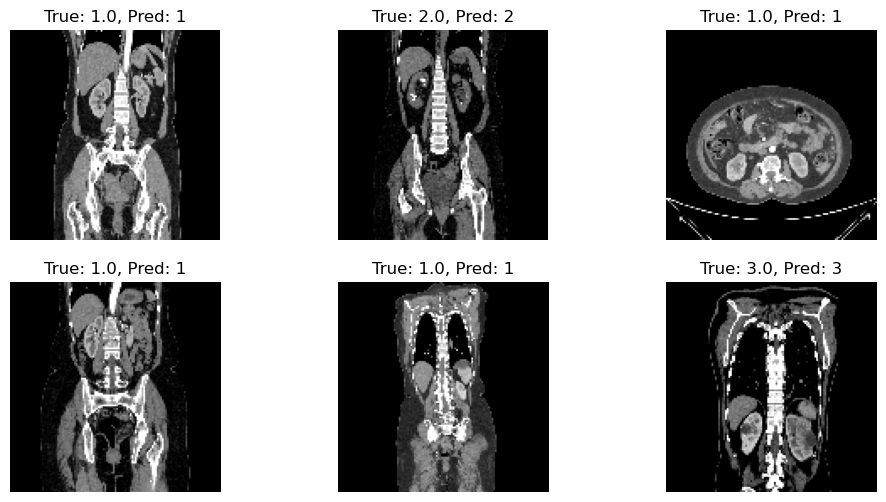

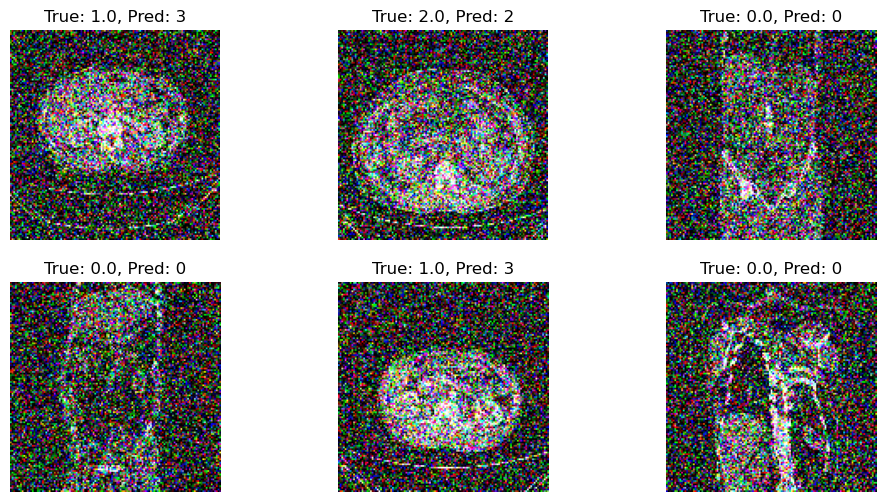

In [60]:
# Plot some sample original test images and their predictions
y_test_pred_labels = np.argmax(model.predict(X_test), axis=1)
plot_sample_images(X_test, y_test, predictions=y_test_pred_labels)

# Plot some sample noisy test images and their predictions
extremely_noisy_X_test = np.array([add_extreme_noise(img) for img in X_test])
extremely_noisy_y_pred_labels = np.argmax(extremely_noisy_y_pred, axis=1)
plot_sample_images(extremely_noisy_X_test, y_test, predictions=extremely_noisy_y_pred_labels)

In [61]:
model.save('CNN model with 125x125 input shape.h5')

#from tensorflow.keras.models import load_model
#loaded_model = load_model('CNN model with 125x125 input shape.h5')

In [62]:
import skimage
from skimage import transform

# Define the rotation function
def rotate(image, angle):
    rotated_image = transform.rotate(image, angle)
    return rotated_image

# Reshape the images
X_test = X_test.reshape(-1, 125, 125, 3)

# Define the rotation angle (degrees)
angle = 5

# Rotate the test images
rotate_X_test = np.array([rotate(img, angle=angle) for img in X_test])

# Make predictions on the rotated test dataset
rotate_y_pred = model.predict(rotate_X_test)
rotate_y_pred_labels = np.argmax(rotate_y_pred, axis=1)

# Calculate accuracy on the rotated test dataset
rotate_test_accuracy = accuracy_score(y_test, rotate_y_pred_labels)
print(f"Rotated test accuracy: {rotate_test_accuracy:.4f}")

# Print the confusion matrix for the rotated test set
rotate_test_cm = confusion_matrix(y_test, rotate_y_pred_labels)
print("Confusion matrix for rotated test dataset:")
print(rotate_test_cm)

39/39 [==============================] - 0s 8ms/step
Rotated test accuracy: 0.9261
Confusion matrix for rotated test dataset:
[[392   0   0   4]
 [ 12 481   4   6]
 [ 43   8  86   0]
 [ 15   0   0 194]]


1/1 [==============================] - 0s 7ms/step


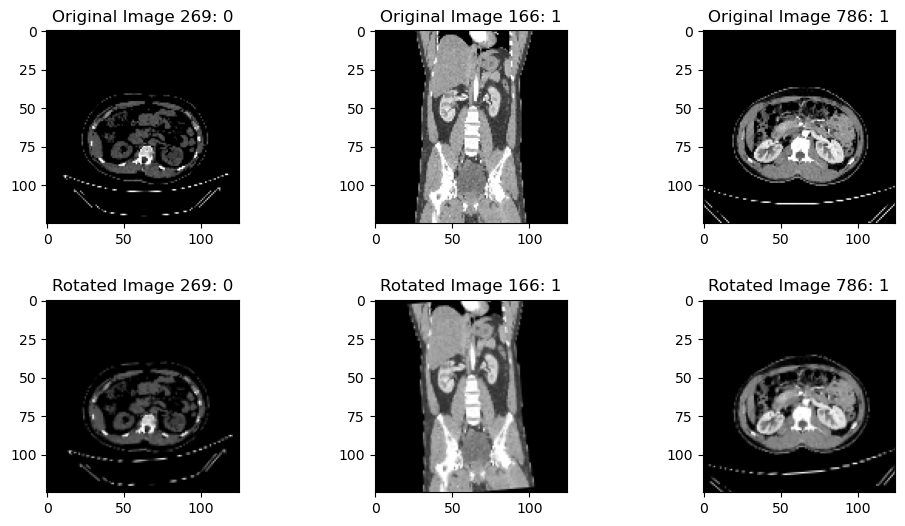

In [63]:
import matplotlib.pyplot as plt

# Define the rotation function
def rotate(image, angle):
    rotated_image = transform.rotate(image, angle)
    rotation_matrix = transform.AffineTransform(rotation=np.deg2rad(angle))
    return rotated_image, rotation_matrix

import random

# Select 3 random images from the rotated test dataset
num_images = 3
image_indices = random.sample(range(len(X_test)), num_images)
images = X_test[image_indices]

# Define the rotation angle (degrees)
angle = 5

# Create a figure with subplots for each image
fig, ax = plt.subplots(2, num_images, figsize=(12, 6))

# Loop through the selected images and plot them
for i, image in enumerate(images):
    # Rotate the image and get the rotation matrix
    rotated_image, rotation_matrix = rotate(image, angle=angle)
    
    # Reshape the image for input to the model
    image = image.reshape(1, 125, 125, 3)
    rotated_image = rotated_image.reshape(1, 125, 125, 3)
    
    # Make predictions on the original and rotated images
    y_pred = model.predict(image)
    rotated_y_pred = model.predict(rotated_image)
    
    # Get the predicted labels
    y_pred_label = np.argmax(y_pred)
    rotated_y_pred_label = np.argmax(rotated_y_pred)
    
    # Plot the original and rotated images side by side
    ax[0, i].imshow(image[0])
    ax[0, i].set_title(f"Original Image {image_indices[i]}: {y_pred_label}")
    ax[1, i].imshow(rotated_image[0])
    ax[1, i].set_title(f"Rotated Image {image_indices[i]}: {rotated_y_pred_label}")

# Add more spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.4)

plt.show()

In [64]:
import random
from sklearn.metrics import accuracy_score
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.1, angle=5):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Add noise and rotation to the test dataset
noisy_rotated_X_test = np.array([add_noise_and_rotate(img) for img in X_test])

# Make predictions on the noisy and rotated test dataset
noisy_rotated_y_pred = model.predict(noisy_rotated_X_test)
noisy_rotated_y_pred_labels = np.argmax(noisy_rotated_y_pred, axis=1)

# Calculate accuracy on the noisy and rotated test dataset
noisy_rotated_test_accuracy = accuracy_score(y_test, noisy_rotated_y_pred_labels)
print(f"Noisy and rotated test accuracy: {noisy_rotated_test_accuracy:.4f}")

# Print the confusion matrix for the noisy and rotated test dataset
noisy_rotated_test_cm = confusion_matrix(y_test, noisy_rotated_y_pred_labels)
print("Confusion matrix for noisy and rotated test dataset:")
print(noisy_rotated_test_cm)

39/39 [==============================] - 0s 8ms/step
Noisy and rotated test accuracy: 0.9293
Confusion matrix for noisy and rotated test dataset:
[[394   0   0   2]
 [ 11 478   7   7]
 [ 33  10  93   1]
 [ 16   1   0 192]]


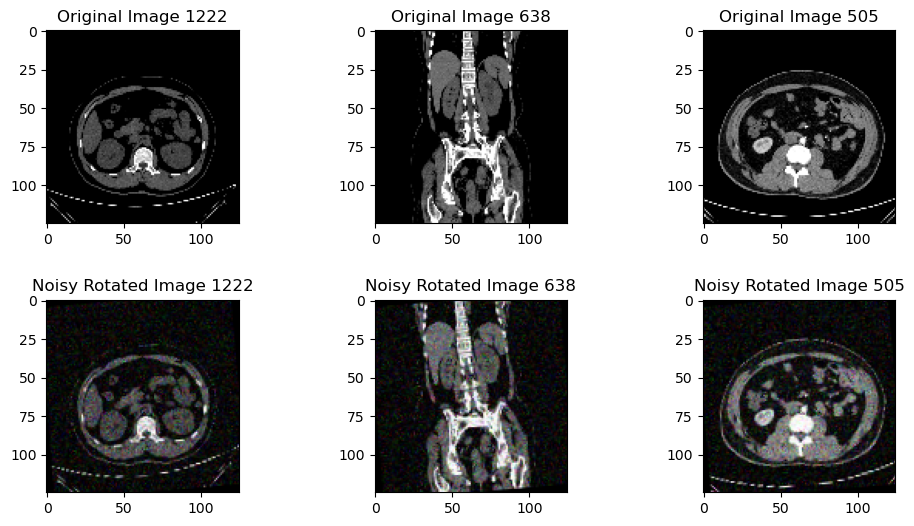

In [65]:
import random
import matplotlib.pyplot as plt
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.1, angle=5):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Select 3 random images from the test dataset
num_images = 3
image_indices = random.sample(range(len(X_test)), num_images)
images = X_test[image_indices]

# Define the rotation angle (degrees) and noise factor
angle = 5
noise_factor = 0.1

# Rotate and add noise to the images
rotated_noisy_images = np.array([add_noise_and_rotate(img, noise_factor=noise_factor, angle=angle) for img in images])

# Create a figure with subplots for each image
fig, ax = plt.subplots(2, num_images, figsize=(12, 6))

# Loop through the selected images and plot them
for i, image in enumerate(images):
    # Plot the original image
    ax[0, i].imshow(image)
    ax[0, i].set_title(f"Original Image {image_indices[i]}")
    
    # Plot the rotated-noisy image
    ax[1, i].imshow(rotated_noisy_images[i])
    ax[1, i].set_title(f"Noisy Rotated Image {image_indices[i]}")

# Add more spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.4)

plt.show()

In [66]:
import random
from sklearn.metrics import accuracy_score
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.3, angle=15):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Add noise and rotation to the test dataset
noisy_rotated_X_test = np.array([add_noise_and_rotate(img) for img in X_test])

# Make predictions on the noisy and rotated test dataset
noisy_rotated_y_pred = model.predict(noisy_rotated_X_test)
noisy_rotated_y_pred_labels = np.argmax(noisy_rotated_y_pred, axis=1)

# Calculate accuracy on the noisy and rotated test dataset
noisy_rotated_test_accuracy = accuracy_score(y_test, noisy_rotated_y_pred_labels)
print(f"Noisy and rotated test accuracy: {noisy_rotated_test_accuracy:.4f}")

# Print the confusion matrix for the noisy and rotated test dataset
noisy_rotated_test_cm = confusion_matrix(y_test, noisy_rotated_y_pred_labels)
print("Confusion matrix for noisy and rotated test dataset:")
print(noisy_rotated_test_cm)

39/39 [==============================] - 0s 10ms/step
Noisy and rotated test accuracy: 0.6450
Confusion matrix for noisy and rotated test dataset:
[[317  15  30  34]
 [  8 332  43 120]
 [ 49  37  25  26]
 [ 35  31  14 129]]


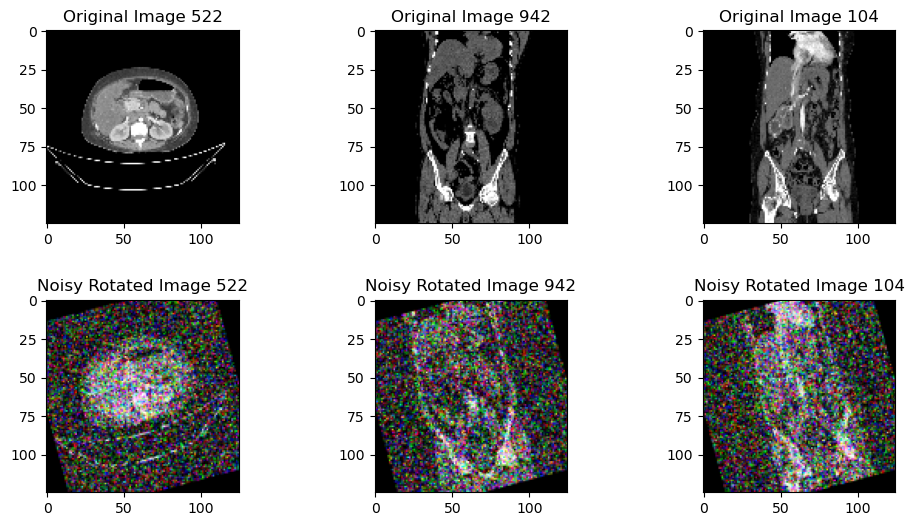

In [67]:
import random
import matplotlib.pyplot as plt
from skimage import transform

def add_noise_and_rotate(image, noise_factor=0.5, angle=15):
    # Add noise
    noisy_image = image + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    
    # Rotate
    rotated_image = transform.rotate(noisy_image, angle)
    
    return rotated_image

# Select 3 random images from the test dataset
num_images = 3
image_indices = random.sample(range(len(X_test)), num_images)
images = X_test[image_indices]

# Define the rotation angle (degrees) and noise factor
angle = 15
noise_factor = 0.5

# Rotate and add noise to the images
rotated_noisy_images = np.array([add_noise_and_rotate(img, noise_factor=noise_factor, angle=angle) for img in images])

# Create a figure with subplots for each image
fig, ax = plt.subplots(2, num_images, figsize=(12, 6))

# Loop through the selected images and plot them
for i, image in enumerate(images):
    # Plot the original image
    ax[0, i].imshow(image)
    ax[0, i].set_title(f"Original Image {image_indices[i]}")
    
    # Plot the rotated-noisy image
    ax[1, i].imshow(rotated_noisy_images[i])
    ax[1, i].set_title(f"Noisy Rotated Image {image_indices[i]}")

# Add more spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.4)

plt.show()